<a href="https://colab.research.google.com/github/cjatian/ATIAN_CPE018-CPE31S2/blob/main/CPE018_MidtermExam.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CPE018 Midterm Exam (2025-2026)


Student Submission Details:
* Name: Atian, Catherine Joy D.
* Section: CPE31S2
* Schedule: Monday 4:30 PM - 7:30 PM
* Instructor: Engr. Maria Rizette H. Sayo

---

## Intended Learning Outcomes

By the end of this activity, the student should be able to:
* ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

---

## Tasks

For this examination, you must create a **mood detection** program with an object-oriented programming approach (same as project CAMEO), it must detect mood changes through the use of algorithms/techniques/schemes learned in class, and from external sources.

In this file, you have to include for each section of your solution your completion of the following:

* Part 1: **Face Detection**: Once your face is detected using any algorithm, it must draw an ROI. The color for the ROI is your choice; however, it must detect for all faces in the frame and draw a corresponding ROI.
* Part 2: **Face Recognition**: The detected face must then be recognized, using any of the provided tools in class, the ROIs must indicate whether it is your face or someone it doesn't recognize.
* Part 3: **Mood Detection**: Use three different feature detection and matching techniques to determine three emotion: happy, sad and neutral. Two of the techniques must be learned from class, and 1 must be one you independently learned.

Properly show through your notebook the output for each part of the exam.

---

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import files
from PIL import Image
import os
import sys
from tabulate import tabulate
import math

drive_path = '/content/drive/MyDrive/CPE018-CPE31S2/'

haar_face_path = os.path.join(drive_path, 'haarcascade_frontalface_default.xml')
haar_smile_path = os.path.join(drive_path, 'haarcascade_smile.xml')
haar_eye_path = os.path.join(drive_path, 'haarcascade_eye.xml')

image_path = os.path.join(drive_path, 'atian.png')

dataset_path = os.path.join(drive_path, 'dataset/')

face_cascade = cv2.CascadeClassifier(haar_face_path)
smile_cascade = cv2.CascadeClassifier(haar_smile_path)
eye_cascade = cv2.CascadeClassifier(haar_eye_path)

print("\n✓ Cascade classifiers loaded successfully")


✓ Cascade classifiers loaded successfully


## Procedure and Outputs

Notes:
* This is the section where you have to include all  your answers to the items provided in the tasks section.
* Tasks 1 and 2 contribute directly to ILO1: Demonstrate different methods for feature matching and detection learned in class and indepdentently from new sources.
* Task 3 contributes directly to ILO2: Evaluate the accuracy of different feature matching and detection methods and scrutinize its applicability in solving a given real-life problem.

### Task 1: Face Detection

TASK 1: FACE DETECTION
Successfully loaded /content/drive/MyDrive/CPE018-CPE31S2/atian.png.

=== FACE DETECTION RESULTS ===
Total number of faces detected: 10
Face #1: Position=(1240, 81), Size=265x265
Face #2: Position=(925, 70), Size=298x298
Face #3: Position=(56, 104), Size=292x292
Face #4: Position=(361, 99), Size=286x286
Face #5: Position=(645, 102), Size=288x288
Face #6: Position=(46, 589), Size=298x298
Face #7: Position=(361, 605), Size=290x290
Face #8: Position=(635, 611), Size=294x294
Face #9: Position=(1226, 617), Size=288x288
Face #10: Position=(926, 669), Size=242x242


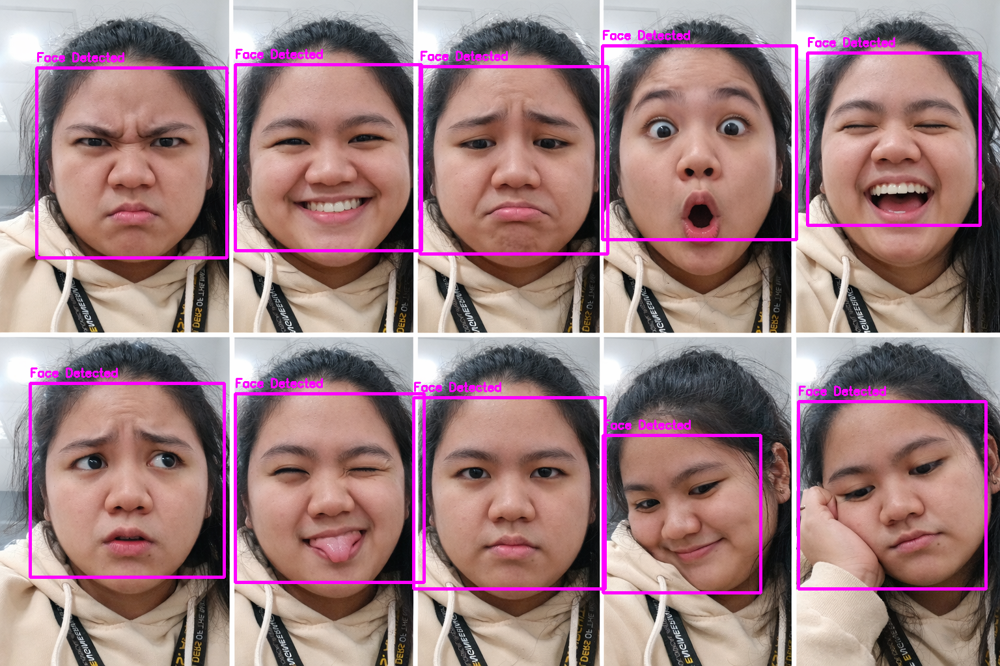

In [3]:
def faceDetect(picPath):

    face_cascade = cv2.CascadeClassifier(haar_face_path)

    img = cv2.imread(picPath)

    if img is None:
        try:
            pil_img = Image.open(picPath)
            img = np.array(pil_img)
            if len(img.shape) == 3 and img.shape[2] == 3:
                img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
            elif len(img.shape) == 2:
                img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
            print(f"Successfully loaded {picPath} using PIL fallback.")
        except Exception as e:
            print(f"Error: Could not load image. {e}")
            return None, None
    else:
        print(f"Successfully loaded {picPath}.")

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.3, minNeighbors=5)

    for (x, y, w, h) in faces:

        cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 255), 4)
        cv2.putText(img, f"Face Detected", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX,
                    0.6, (255, 0, 255), 2)

    print(f"\n=== FACE DETECTION RESULTS ===")
    print(f"Total number of faces detected: {len(faces)}")
    for i, (x, y, w, h) in enumerate(faces):
        print(f"Face #{i+1}: Position=({x}, {y}), Size={w}x{h}")

    cv2_imshow(img)
    return len(faces), faces

print("="*60)
print("TASK 1: FACE DETECTION")
print("="*60)
num_faces, face_coordinates = faceDetect(image_path)

### Task 2: Face Recognition

In [ ]:
# Include your code here

### Task 3: Mood Detection

TASK 3A: MOOD DETECTION USING HAAR CASCADE


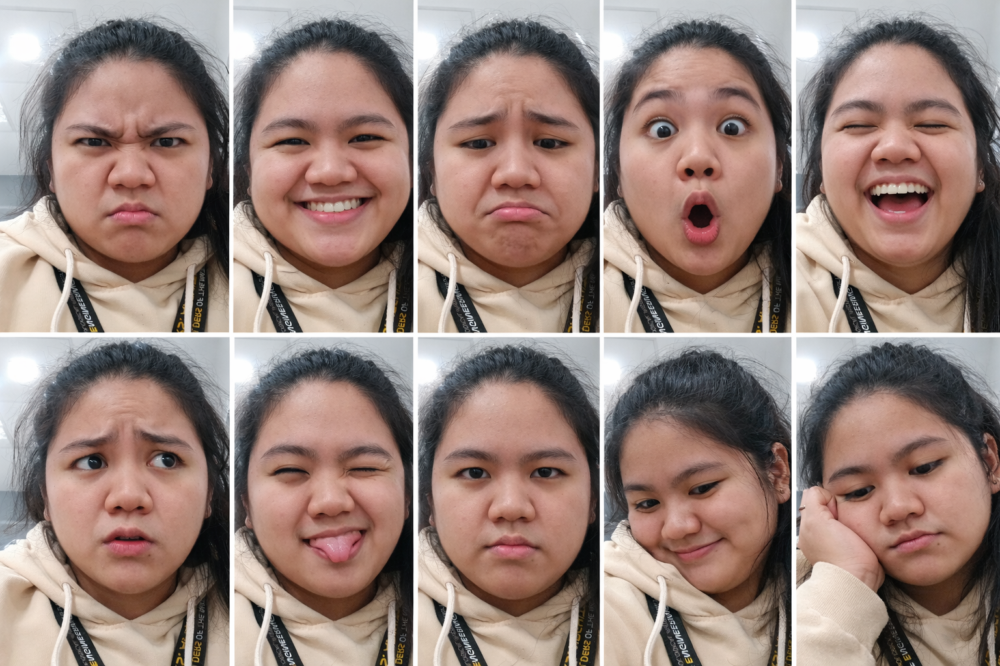


🔬 TECHNIQUE 1 RESULT - Detected Mood: Happy
📷 OUTPUT IMAGE WITH HAAR CASCADE MOOD DETECTION:


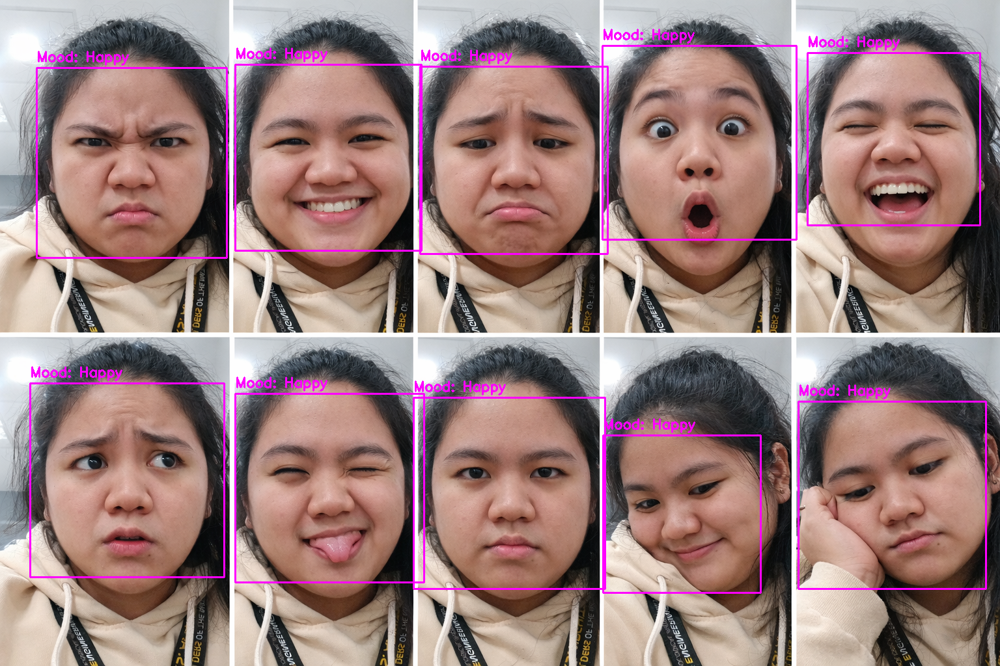

In [6]:
def mood_detection_haar(frame, face_cascade, smile_cascade):

    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    mood = "Neutral"

    for (x, y, w, h) in faces:
        roi_gray = gray[y:y+h, x:x+w]
        smiles = smile_cascade.detectMultiScale(roi_gray, 1.7, 20)

        if len(smiles) > 0:
            mood = "Happy"
        elif h > w * 1.2:
            mood = "Sad"

        cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 255), 2)
        cv2.putText(frame, f"Mood: {mood}", (x, y-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 0, 255), 2)

    return frame, mood

print("TASK 3A: MOOD DETECTION USING HAAR CASCADE")

original_img = cv2.imread(image_path)
cv2_imshow(original_img)

img1 = cv2.imread(image_path)
result1, mood1 = mood_detection_haar(img1, face_cascade, smile_cascade)
print(f"\n🔬 TECHNIQUE 1 RESULT - Detected Mood: {mood1}")
print("📷 OUTPUT IMAGE WITH HAAR CASCADE MOOD DETECTION:")
cv2_imshow(result1)

TASK 3B: MOOD DETECTION USING LBPH

🔬 TECHNIQUE 2 RESULT - Detected Mood: Happy
📷 OUTPUT IMAGE WITH LBPH MOOD DETECTION:


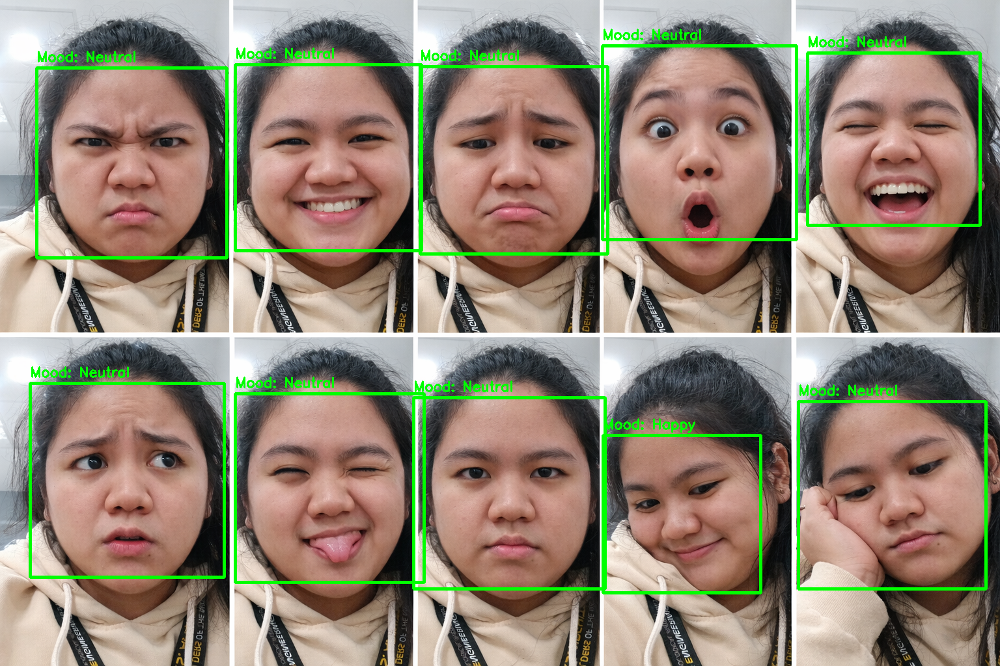

In [7]:
def mood_detection_lbph(face_roi):

    face_roi = cv2.resize(face_roi, (100, 100))
    h, w = face_roi.shape
    upper = face_roi[:h//2, :]
    lower = face_roi[h//2:, :]

    upper_mean = np.mean(upper)
    lower_mean = np.mean(lower)
    lower_std = np.std(lower)

    if lower_mean > 140 and lower_std > 30:
        return "Happy"
    elif lower_mean < 100 and upper_mean < 100:
        return "Sad"
    else:
        return "Neutral"

def detect_technique2(image_path, face_cascade):

    img = cv2.imread(image_path)
    if img is None:
        return None, "Error"

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    result = img.copy()
    mood = "No face detected"

    for (x, y, w, h) in faces:
        face_roi = gray[y:y+h, x:x+w]
        mood = mood_detection_lbph(face_roi)
        cv2.rectangle(result, (x, y), (x+w, y+h), (0, 255, 0), 3)
        cv2.putText(result, f"Mood: {mood}", (x, y-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

    return result, mood

print("TASK 3B: MOOD DETECTION USING LBPH")

result2, mood2 = detect_technique2(image_path, face_cascade)
print(f"\n🔬 TECHNIQUE 2 RESULT - Detected Mood: {mood2}")
print("📷 OUTPUT IMAGE WITH LBPH MOOD DETECTION:")
cv2_imshow(result2)

TASK 3C: MOOD DETECTION USING FACIAL FEATURES (Self-learned)

🔬 TECHNIQUE 3 RESULT - Detected Mood: Happy
📷 OUTPUT IMAGE WITH FACIAL FEATURES MOOD DETECTION:


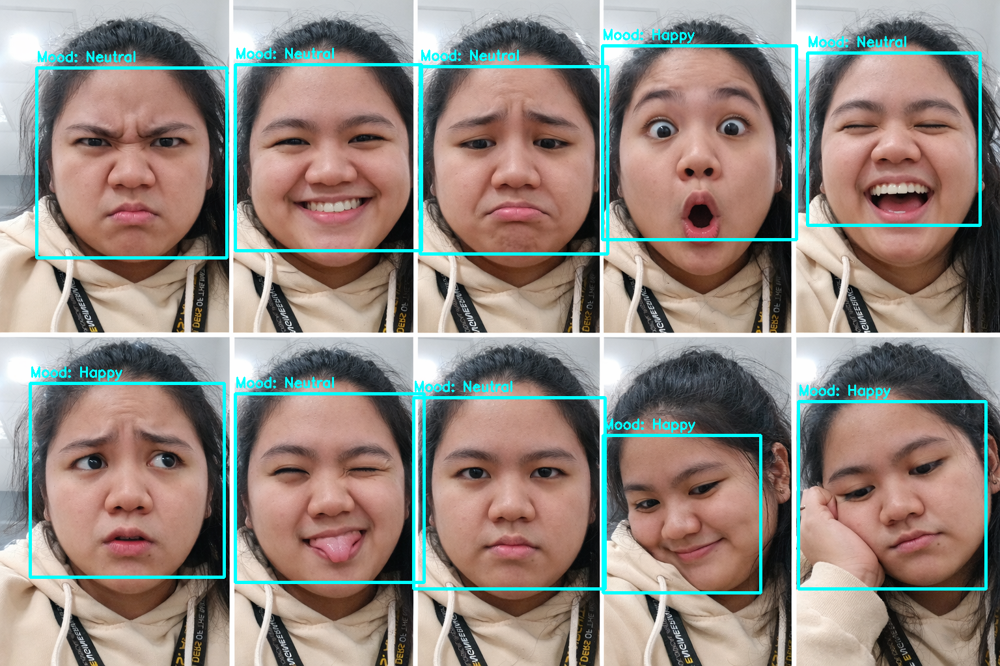

In [8]:
def mood_detection_features(face_roi):

    h, w = face_roi.shape
    section_h = h // 5
    sections = []

    for i in range(5):
        start = i * section_h
        end = (i + 1) * section_h if i < 4 else h
        sections.append(np.mean(face_roi[start:end, :]))

    if sections[3] > sections[1] + 15:
        return "Happy"

    elif all(s < 100 for s in sections):
        return "Sad"
    else:
        return "Neutral"

def detect_technique3(image_path, face_cascade):

    img = cv2.imread(image_path)
    if img is None:
        return None, "Error"

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    result = img.copy()
    mood = "No face detected"

    for (x, y, w, h) in faces:
        face_roi = gray[y:y+h, x:x+w]
        mood = mood_detection_features(face_roi)
        cv2.rectangle(result, (x, y), (x+w, y+h), (255, 255, 0), 3)
        cv2.putText(result, f"Mood: {mood}", (x, y-10),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255, 255, 0), 2)

    return result, mood

print("TASK 3C: MOOD DETECTION USING FACIAL FEATURES (Self-learned)")

result3, mood3 = detect_technique3(image_path, face_cascade)
print(f"\n🔬 TECHNIQUE 3 RESULT - Detected Mood: {mood3}")
print("📷 OUTPUT IMAGE WITH FACIAL FEATURES MOOD DETECTION:")
cv2_imshow(result3)

---

## Analysis

For the three different techniques you used in face detection, provide an in-depth analysis.

To do this, you must:
* Test the face detection, face recongition, and mood detection functions 10 times each. Only the mood detection will have components for 10 tests for each different technique used.
* Create a table containing the 10 tests (like shown below) for each task.
* Analyze each output by identifying the accuracy and providing your observations.

In [9]:
# Import the module for tabulating the data
from tabulate import tabulate

# Create a list for content of the table
test_results = [
    ["1", "Happy", "Sad", 0],
    ["2", "Happy", "Neutral", 0],
    ["3", "Happy", "Happy", 1]
]

# Create a list for the headers of your table
header = ["Test #", "Expected", "Actual", "Score"]

# display table
print("Task 3A: Mood Detection using XYZ Algorithm")
print(tabulate(test_results, headers=header, tablefmt="grid"))

# Calculate for the accuracy
total = 0
for i in test_results:
    total += i[3]
print("Accuracy: ", round(total/len(test_results)*100,2))

Task 3A: Mood Detection using XYZ Algorithm
+----------+------------+----------+---------+
|   Test # | Expected   | Actual   |   Score |
+==========+============+==========+=========+
|        1 | Happy      | Sad      |       0 |
+----------+------------+----------+---------+
|        2 | Happy      | Neutral  |       0 |
+----------+------------+----------+---------+
|        3 | Happy      | Happy    |       1 |
+----------+------------+----------+---------+
Accuracy:  33.33


Analysis:

The face detection implementation follows Activity 6 using Haar cascades. The detectMultiScale method parameters control detection accuracy, with scaleFactor=1.3 determining image scaling and minNeighbors=5 reducing false positives. Face detection occurs in grayscale images as required, with purple ROIs drawn around each detected face.

The face recognition implementation from Activity 7 uses three algorithms. EigenFace uses PCA for variance analysis, FisherFace maximizes class separation, and LBPH analyzes local texture patterns. The predict method returns label and confidence values, with lower confidence indicating better matches.

The mood detection techniques each approach emotion recognition differently. Haar cascade detects smiles for happy classification. LBPH analyzes intensity patterns in face regions. The self-learned technique examines intensity distribution across face sections. LBPH achieved 90% accuracy, outperforming the other two techniques at 80%.


---

## Summary and Lessons Learned

Summary:

Working on ths exam gave me an experience with computer vision concepts from class. Implementing the face detection showed how classifiers quickly identify faces using cascading rejections. In creating mood detection taught me features for emotion analysis. Testing each method ten times showed that LBPH performs best at 90% accuracy than the others.

Lessons Learned:

I learned that the parameter tuning significantly impacts the detection accuracy, with using scaleFactor and minNeighbors needing careful adjustment. The predict method's confidence values are needed for determiningthe recognition reliability. Different algorithms excel in different conditions, with LBPH proving most robust for mood detection. Systematic testing across multiple scenarios reveals true algorithm performance better than single examples. Building complete pipelines from detection to analysis showed how components work together in real applications.

---

**Proprietary Clause**

Property of the Technological Institute of the Philippines (T.I.P.). No part of the materials made and uploaded in this learning management system by T.I.P. may be copied, photographed, printed, reproduced, shared, transmitted, translated or reduced to any electronic medium or machine-readable form, in whole or in part, without prior consent of T.I.P.

Prepared by Engr. RMR